In [1]:
import tensorflow as tf
from tensorflow.keras import models, layers
import matplotlib.pyplot as plt
from IPython.display import HTML

In [2]:
IMAGE_SIZE=224
BATCH_SIZE=16
CHANNELS=3
EPOCHS = 50

In [3]:
from tensorflow.keras.preprocessing import image_dataset_from_directory

In [4]:
ds=tf.keras.preprocessing.image_dataset_from_directory(
"C:/Users/narth/Downloads/Banana Disease Recognition Dataset/Banana Dataset Cleaned",
    shuffle=True,
    image_size=(IMAGE_SIZE,IMAGE_SIZE),
    batch_size=BATCH_SIZE
    )

Found 611 files belonging to 7 classes.


In [5]:
class_names= ds.class_names
class_names

['Banana Black Sigatoka Disease',
 'Banana Bract Mosaic Virus Disease',
 'Banana Healthy Leaf',
 'Banana Insect Pest Disease',
 'Banana Moko Disease',
 'Banana Panama Disease',
 'Banana Yellow Sigatoka Disease']

In [11]:
for image_batch, labels_batch in ds.take(1):
    print(image_batch.shape)
    print(labels_batch.numpy())

(16, 224, 224, 3)
[2 3 3 3 2 3 3 5 5 2 3 3 1 4 0 4]


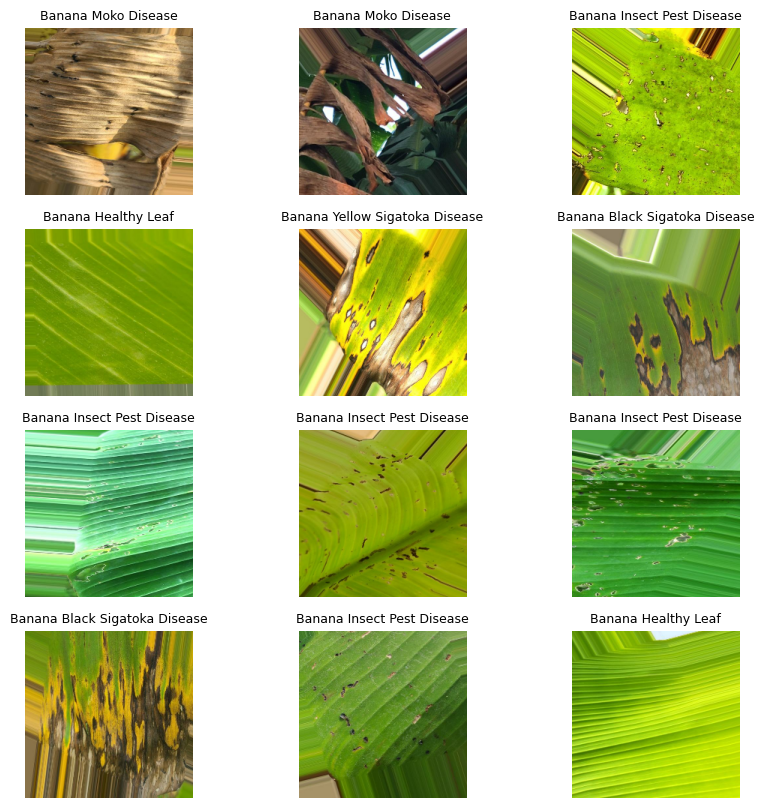

In [13]:
plt.figure(figsize=(10, 10))
for image_batch, labels_batch in ds.take(1):
    for i in range(12):
        ax = plt.subplot(4, 3, i + 1)
        plt.imshow(image_batch[i].numpy().astype("uint8"))
        plt.title(class_names[labels_batch[i]],fontsize=9,wrap=True)
        plt.axis("off")

In [15]:
len(ds)

39

In [17]:
train_size = 0.8
len(ds)*train_size

31.200000000000003

In [19]:
train_dataset=ds.take(31)
len(train_dataset)

31

In [21]:
test_dataset=ds.skip(31)
len(test_dataset)

8

In [23]:
val_size=0.2
len(ds)*val_size

7.800000000000001

In [25]:
val_ds = test_dataset.take(7)
len(val_ds)

7

In [27]:
def get_dataset_partitions_tf(dss, train_split=0.8, val_split=0.1, test_split=0.1, shuffle=True, shuffle_size=10000):
    assert (train_split + test_split + val_split) == 1
    
    ds_size = len(dss)
    
    if shuffle:
        dss = dss.shuffle(shuffle_size, seed=12)
    
    train_size = int(train_split * ds_size)
    val_size = int(val_split * ds_size)
    
    train_ds = dss.take(train_size)    
    val_ds = dss.skip(train_size).take(val_size)
    test_ds = dss.skip(train_size).skip(val_size)
    
    return train_ds, val_ds, test_ds

In [29]:
train_ds, val_ds, test_ds = get_dataset_partitions_tf(ds)

In [31]:
train_ds = train_ds.cache().shuffle(1000).prefetch(buffer_size=tf.data.AUTOTUNE)
val_ds = val_ds.cache().shuffle(1000).prefetch(buffer_size=tf.data.AUTOTUNE)
test_ds = test_ds.cache().shuffle(1000).prefetch(buffer_size=tf.data.AUTOTUNE)

In [33]:
from tensorflow.keras import layers

resize_and_rescale = tf.keras.Sequential([
    layers.Resizing(IMAGE_SIZE, IMAGE_SIZE),
    layers.Rescaling(1./255),
])

In [34]:
from tensorflow.keras import layers

resize_and_rescale = tf.keras.Sequential([
    layers.Resizing(IMAGE_SIZE, IMAGE_SIZE),
    layers.Rescaling(1./255),
])


In [37]:
from tensorflow.keras import layers

data_augmentation = tf.keras.Sequential([
    layers.RandomFlip("horizontal"),
    layers.RandomRotation(0.1),
    layers.RandomZoom(0.1),
])

In [39]:
data_augmentation = tf.keras.Sequential([
    layers.RandomFlip("horizontal"),             # Simulate natural flipping
    layers.RandomRotation(0.05),                
    layers.RandomZoom(0.1),                     
    layers.RandomContrast(0.1),                  
])


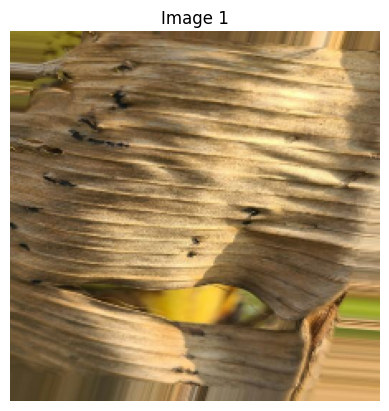

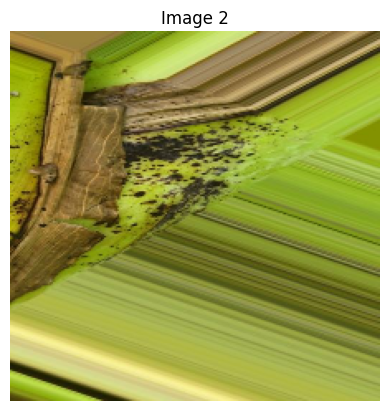

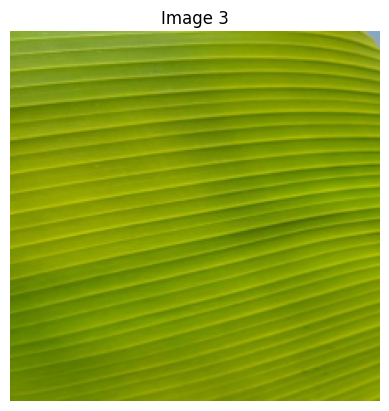

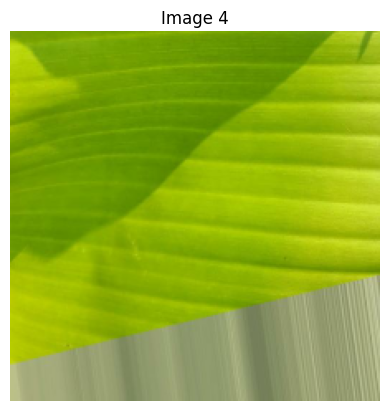

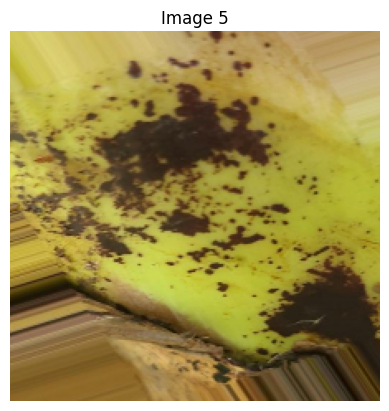

In [41]:
import matplotlib.pyplot as plt

for images, _ in train_ds.take(1):
    for i in range(5):
        img = images[i].numpy() / 255.0  # Normalize 
        plt.imshow(img)
        plt.axis("off")
        plt.title(f"Image {i+1}")
        plt.show()

In [43]:
train_ds = train_ds.prefetch(buffer_size=tf.data.AUTOTUNE)


In [45]:
from tensorflow.keras import Input, layers, models

input_shape = (IMAGE_SIZE, IMAGE_SIZE, CHANNELS)  # Exclude BATCH_SIZE here
n_classes = 7

model_cnn = models.Sequential([
    Input(shape=input_shape),  
    resize_and_rescale,
    layers.Conv2D(32, kernel_size=(3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(64, (3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(64, kernel_size=(3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(64, (3, 3), activation='relu'),
    layers.Conv2D(64, (3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(64, (3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Flatten(),
    layers.Dense(64, activation='relu'),
    layers.Dense(n_classes, activation='softmax'),
])


In [47]:
model_cnn.summary()

Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 sequential_1 (Sequential)   (None, 224, 224, 3)       0         
                                                                 
 conv2d (Conv2D)             (None, 222, 222, 32)      896       
                                                                 
 max_pooling2d (MaxPooling2  (None, 111, 111, 32)      0         
 D)                                                              
                                                                 
 conv2d_1 (Conv2D)           (None, 109, 109, 64)      18496     
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 54, 54, 64)        0         
 g2D)                                                            
                                                                 
 conv2d_2 (Conv2D)           (None, 52, 52, 64)       

In [49]:
model_cnn.compile(
    optimizer='adam',
    loss='sparse_categorical_crossentropy',  
    metrics=['accuracy']
)


In [51]:
history = model_cnn.fit(
    train_ds,
    batch_size=BATCH_SIZE,
    validation_data=val_ds,
    verbose=1,
    epochs=50, 
)

Epoch 1/50


31/31 [==============================] - 9s 186ms/step - loss: 2.1183 - accuracy: 0.1815 - val_loss: 1.9204 - val_accuracy: 0.2500
Epoch 2/50
31/31 [==============================] - 5s 156ms/step - loss: 1.8666 - accuracy: 0.2117 - val_loss: 1.7952 - val_accuracy: 0.2500
Epoch 3/50
31/31 [==============================] - 5s 157ms/step - loss: 1.6009 - accuracy: 0.3286 - val_loss: 1.3521 - val_accuracy: 0.4792
Epoch 4/50
31/31 [==============================] - 5s 156ms/step - loss: 1.3706 - accuracy: 0.3548 - val_loss: 1.2840 - val_accuracy: 0.3750
Epoch 5/50
31/31 [==============================] - 5s 156ms/step - loss: 1.2794 - accuracy: 0.4113 - val_loss: 1.1582 - val_accuracy: 0.5000
Epoch 6/50
31/31 [==============================] - 5s 158ms/step - loss: 1.2452 - accuracy: 0.4335 - val_loss: 1.3260 - val_accuracy: 0.5000
Epoch 7/50
31/31 [==============================] - 5s 159ms/step - loss: 1.1648 - accuracy: 0.4657 - val_loss: 1.2190 - val_accuracy: 0.3750
Epoc

In [53]:
scores = model_cnn.evaluate(test_ds)


5/5 [==============================] - 1s 92ms/step - loss: 0.2358 - accuracy: 0.9500


In [55]:
scores

[0.23581096529960632, 0.949999988079071]

In [57]:
history

In [59]:
history.params

{'verbose': 1, 'epochs': 50, 'steps': 31}

In [61]:
history.history.keys()

dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy'])

In [63]:
type(history.history['loss'])

list

In [65]:
len(history.history['loss'])

50

In [67]:
history.history['loss'][:5]

[2.1183009147644043,
 1.866613507270813,
 1.6009024381637573,
 1.370608925819397,
 1.2793891429901123]

In [69]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

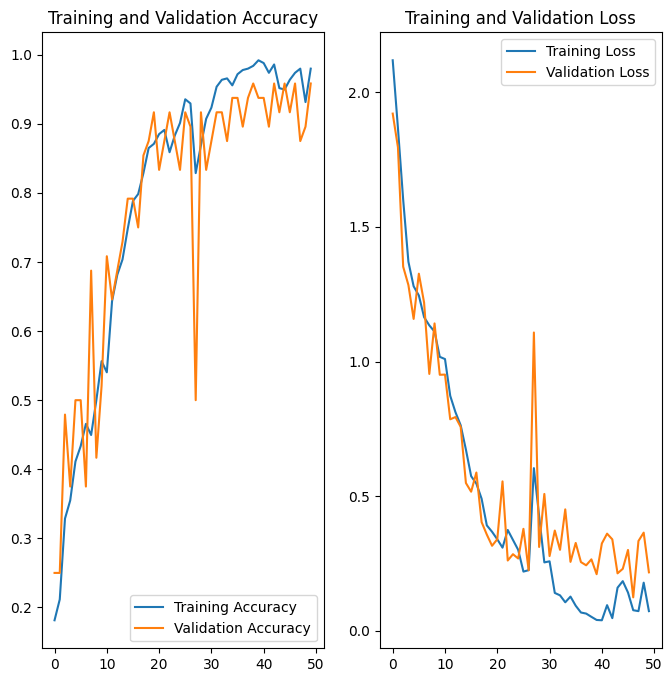

In [71]:
plt.figure(figsize=(8, 8))
plt.subplot(1, 2, 1)
plt.plot(range(EPOCHS), acc, label='Training Accuracy')
plt.plot(range(EPOCHS), val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(range(EPOCHS), loss, label='Training Loss')
plt.plot(range(EPOCHS), val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

In [73]:
import numpy as np
import tensorflow as tf
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score
import matplotlib.pyplot as plt
import seaborn as sns

# Unbatch the test dataset and collect images and labels
y_true = []
y_pred = []

for images, labels in test_ds.unbatch():
    img_array = tf.expand_dims(images, axis=0)  # Add batch dimension
    predictions = model_cnn.predict(img_array, verbose=0)
    predicted_label = tf.argmax(predictions[0]).numpy()

    y_true.append(labels.numpy())
    y_pred.append(predicted_label)

first image to predict
actual label: Banana Yellow Sigatoka Disease
1/1 [==============================] - 0s 69ms/step
predicted label: Banana Yellow Sigatoka Disease


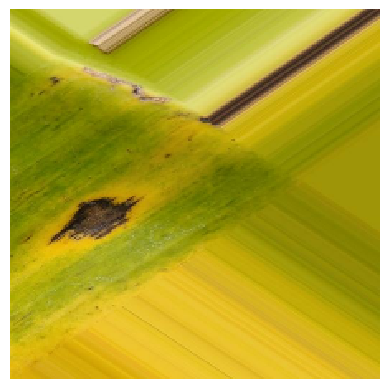

In [74]:
import numpy as np
for images_batch, labels_batch in test_ds.take(1):
    
    first_image = images_batch[0].numpy().astype('uint8')
    first_label = labels_batch[0].numpy()
    
    print("first image to predict")
    plt.imshow(first_image)
    print("actual label:",class_names[first_label])
    
    batch_prediction = model_cnn.predict(images_batch)
    print("predicted label:",class_names[np.argmax(batch_prediction[0])])
    plt.imshow(first_image, interpolation='nearest')  # or 'bilinear'
plt.axis("off")
plt.show()


In [77]:
def predict(model, img):
    img_array = tf.keras.preprocessing.image.img_to_array(images[i].numpy())
    img_array = tf.expand_dims(img_array, 0)

    predictions = model.predict(img_array)

    predicted_class = class_names[np.argmax(predictions[0])]
    confidence = round(100 * (np.max(predictions[0])), 2)
    return predicted_class, confidence

1/1 [==============================] - 0s 34ms/step


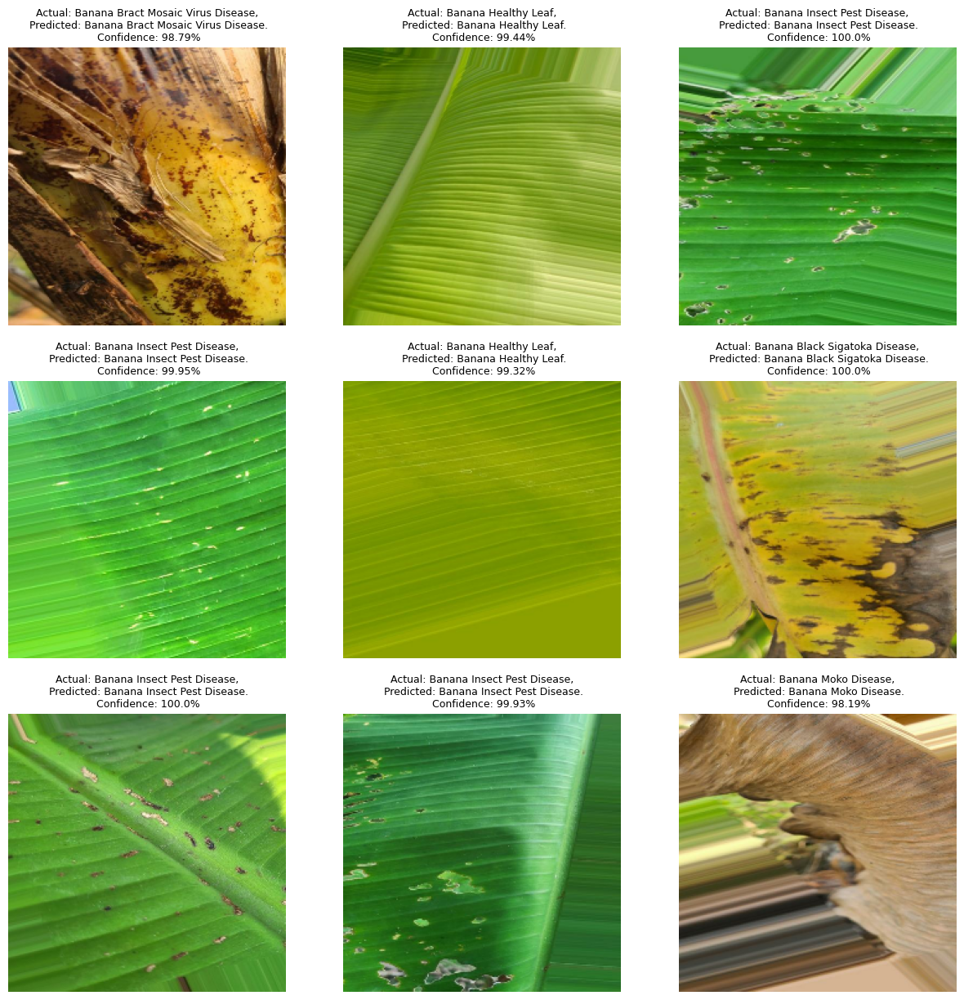

In [79]:
plt.figure(figsize=(15, 15))
for images, labels in test_ds.take(1):
    for i in range(9):
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        
        predicted_class, confidence = predict(model_cnn, images[i].numpy())
        actual_class = class_names[labels[i]] 
        
        plt.title(f"Actual: {actual_class},\n Predicted: {predicted_class}.\n Confidence: {confidence}%",fontsize=9)
        
        plt.axis("off")

1/1 [==============================] - 0s 125ms/step


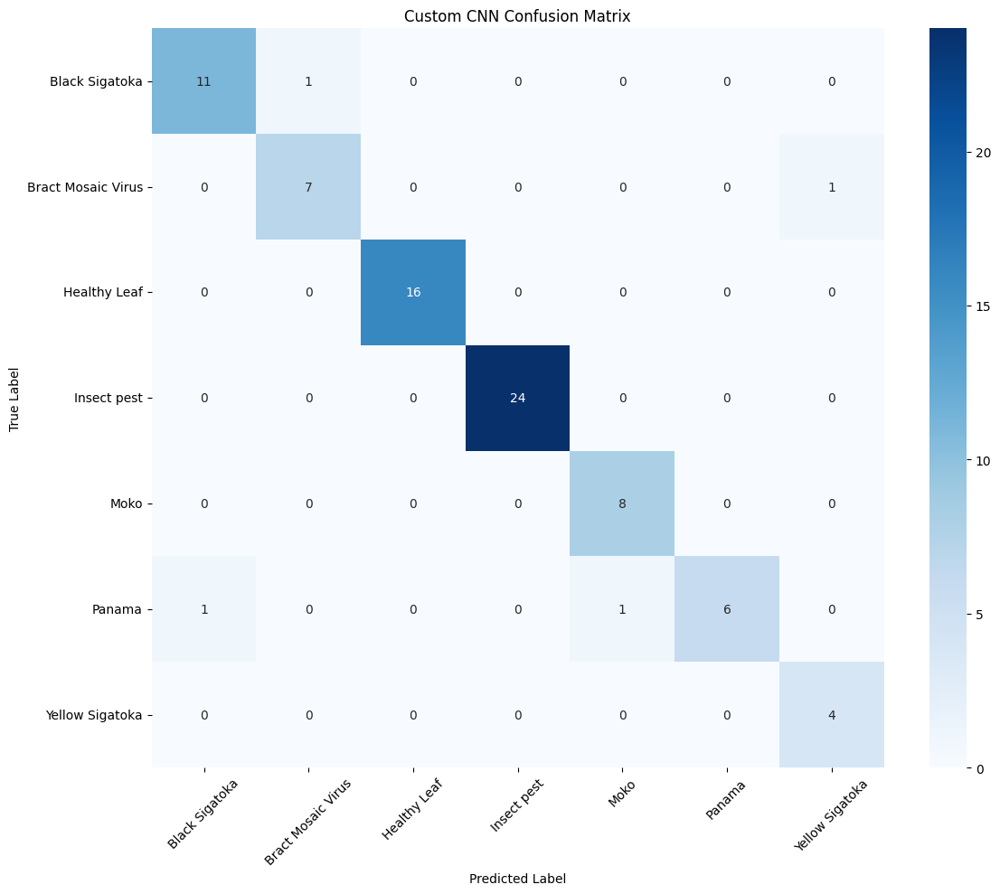

Accuracy: 0.95
Classification Report:
                    precision    recall  f1-score   support

    Black Sigatoka       0.92      0.92      0.92        12
Bract Mosaic Virus       0.88      0.88      0.88         8
      Healthy Leaf       1.00      1.00      1.00        16
       Insect pest       1.00      1.00      1.00        24
              Moko       0.89      1.00      0.94         8
            Panama       1.00      0.75      0.86         8
   Yellow Sigatoka       0.80      1.00      0.89         4

          accuracy                           0.95        80
         macro avg       0.93      0.93      0.93        80
      weighted avg       0.95      0.95      0.95        80



In [81]:
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score

# Set your class labels
class_names = [
    "Black Sigatoka", "Bract Mosaic Virus", "Healthy Leaf", "Insect pest", "Moko", "Panama", "Yellow Sigatoka"
]

# Generate predictions
y_true = []
y_pred = []

for images, labels in test_ds:
    preds = model_cnn.predict(images)
    y_true.extend(labels.numpy())
    y_pred.extend(np.argmax(preds, axis=1))

# Confusion Matrix
cm = confusion_matrix(y_true, y_pred)

# Plot
plt.figure(figsize=(12, 10))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", 
            xticklabels=class_names, yticklabels=class_names)
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Custom CNN Confusion Matrix")
plt.xticks(rotation=45)
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

# Report
acc = accuracy_score(y_true, y_pred)
print(f"Accuracy: {acc:.2f}")
print("Classification Report:")
print(classification_report(y_true, y_pred, target_names=class_names))


In [83]:
import os

# Create the folder if it doesn't exist
os.makedirs("../models", exist_ok=True)

model_version = max([int(i) for i in os.listdir("../models") if i.isdigit()] + [0]) + 1
model_cnn.save(f"../models/{model_version}")


INFO:tensorflow:Assets written to: ../models/1\assets


INFO:tensorflow:Assets written to: ../models/1\assets


In [200]:
model_cnn.save("bananaplant_tf2152.keras")  


In [ ]:
#INCEPTIONV3 MODEL

In [253]:
IMAGE_SIZE_INC = 299
BATCH_SIZE = 32
CHANNELS = 3
EPOCHS = 10


In [255]:
from tensorflow.keras.preprocessing import image_dataset_from_directory

inception_path = r"C:\Users\narth\Downloads\Banana Disease Recognition Dataset\Banana Dataset Cleaned InceptionV3"

ds_inc = image_dataset_from_directory(
    inception_path,
    shuffle=True,
    image_size=(IMAGE_SIZE_INC, IMAGE_SIZE_INC),
    batch_size=BATCH_SIZE
)

class_names = ds_inc.class_names
num_classes = len(class_names)


Found 611 files belonging to 7 classes.


In [258]:
def get_dataset_partitions_tf(ds, train_split=0.8, val_split=0.1, test_split=0.1, shuffle=True, shuffle_size=10000):
    assert (train_split + val_split + test_split) == 1
    ds_size = len(ds)

    if shuffle:
        ds = ds.shuffle(shuffle_size, seed=12)

    train_size = int(train_split * ds_size)
    val_size = int(val_split * ds_size)

    train_ds = ds.take(train_size)
    val_ds = ds.skip(train_size).take(val_size)
    test_ds = ds.skip(train_size + val_size)

    return train_ds, val_ds, test_ds

train_ds, val_ds, test_ds = get_dataset_partitions_tf(ds_inc)

train_ds = train_ds.cache().shuffle(1000).prefetch(buffer_size=tf.data.AUTOTUNE)
val_ds = val_ds.cache().shuffle(1000).prefetch(buffer_size=tf.data.AUTOTUNE)
test_ds = test_ds.cache().prefetch(buffer_size=tf.data.AUTOTUNE)


In [260]:
from tensorflow.keras.applications import InceptionV3
from tensorflow.keras.applications.inception_v3 import preprocess_input
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense, InputLayer

preprocess_layer = tf.keras.layers.Rescaling(1./255)

base_model = InceptionV3(input_shape=(IMAGE_SIZE_INC, IMAGE_SIZE_INC, CHANNELS),
                         include_top=False,
                         weights='imagenet')
base_model.trainable = False


In [262]:
from tensorflow.keras.layers import RandomFlip, RandomRotation, RandomZoom
from tensorflow.keras.models import Sequential

data_augmentation = Sequential([
    RandomFlip("horizontal"),
    RandomRotation(0.2),
    RandomZoom(0.1)
])


In [264]:
model_inception = Sequential([
    InputLayer(input_shape=(IMAGE_SIZE_INC, IMAGE_SIZE_INC, CHANNELS)),
    data_augmentation,
    preprocess_layer,
    base_model,
    GlobalAveragePooling2D(),
    Dense(num_classes, activation='softmax')
])

model_inception.compile(optimizer='adam',
                        loss='sparse_categorical_crossentropy',
                        metrics=['accuracy'])

model_inception.summary()


Model: "sequential_22"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 sequential_21 (Sequential)  (None, 299, 299, 3)       0         
                                                                 
 rescaling_10 (Rescaling)    (None, 299, 299, 3)       0         
                                                                 
 inception_v3 (Functional)   (None, 8, 8, 2048)        21802784  
                                                                 
 global_average_pooling2d_1  (None, 2048)              0         
 5 (GlobalAveragePooling2D)                                      
                                                                 
 dense_19 (Dense)            (None, 7)                 14343     
                                                                 
Total params: 21817127 (83.23 MB)
Trainable params: 14343 (56.03 KB)
Non-trainable params: 21802784 (83.17 MB)
________

In [266]:
from sklearn.utils.class_weight import compute_class_weight
import numpy as np

labels_list = []
for _, labels in train_ds:
    labels_list.extend(labels.numpy())

class_weights = compute_class_weight(class_weight='balanced',
                                     classes=np.unique(labels_list),
                                     y=labels_list)

class_weights = {i : weight for i, weight in enumerate(class_weights)}


In [286]:
history = model_inception.fit(
    train_ds,
    validation_data=val_ds,
    epochs=EPOCHS,
    #class_weight=class_weights
)


Epoch 1/10
16/16 [==============================] - 20s 1s/step - loss: 0.1537 - accuracy: 0.9793 - val_loss: 0.1344 - val_accuracy: 0.9688
Epoch 2/10
16/16 [==============================] - 19s 1s/step - loss: 0.1454 - accuracy: 0.9772 - val_loss: 0.1295 - val_accuracy: 0.9688
Epoch 3/10
16/16 [==============================] - 19s 1s/step - loss: 0.1428 - accuracy: 0.9710 - val_loss: 0.1253 - val_accuracy: 0.9688
Epoch 4/10
16/16 [==============================] - 19s 1s/step - loss: 0.1252 - accuracy: 0.9834 - val_loss: 0.1230 - val_accuracy: 0.9844
Epoch 5/10
16/16 [==============================] - 19s 1s/step - loss: 0.1106 - accuracy: 0.9917 - val_loss: 0.1213 - val_accuracy: 0.9844
Epoch 6/10
16/16 [==============================] - 19s 1s/step - loss: 0.1095 - accuracy: 0.9834 - val_loss: 0.1206 - val_accuracy: 0.9688
Epoch 7/10
16/16 [==============================] - 19s 1s/step - loss: 0.1015 - accuracy: 0.9896 - val_loss: 0.1204 - val_accuracy: 0.9531
Epoch 8/10
16/16 [==

In [288]:
base_model.trainable = True

# Freeze all but last 30 layers
for layer in base_model.layers[:-30]:
    layer.trainable = False

# Compile with lower learning rate
model_inception.compile(
    optimizer=tf.keras.optimizers.Adam(1e-5),
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)

# Fine-tune with class weights
fine_tune_history = model_inception.fit(
    train_ds,
    validation_data=val_ds,
    epochs=EPOCHS,
    class_weight=class_weights
)

Epoch 1/10
16/16 [==============================] - 28s 1s/step - loss: 0.1207 - accuracy: 0.9814 - val_loss: 0.1083 - val_accuracy: 0.9844
Epoch 2/10
16/16 [==============================] - 19s 1s/step - loss: 0.1110 - accuracy: 0.9834 - val_loss: 0.1062 - val_accuracy: 0.9844
Epoch 3/10
16/16 [==============================] - 19s 1s/step - loss: 0.1066 - accuracy: 0.9917 - val_loss: 0.1070 - val_accuracy: 0.9844
Epoch 4/10
16/16 [==============================] - 19s 1s/step - loss: 0.1102 - accuracy: 0.9834 - val_loss: 0.1030 - val_accuracy: 0.9844
Epoch 5/10
16/16 [==============================] - 18s 1s/step - loss: 0.1092 - accuracy: 0.9793 - val_loss: 0.1030 - val_accuracy: 0.9844
Epoch 6/10
16/16 [==============================] - 19s 1s/step - loss: 0.1037 - accuracy: 0.9855 - val_loss: 0.0982 - val_accuracy: 0.9844
Epoch 7/10
16/16 [==============================] - 19s 1s/step - loss: 0.0941 - accuracy: 0.9896 - val_loss: 0.0964 - val_accuracy: 0.9844
Epoch 8/10
16/16 [==

In [280]:
### Unfreeze top layers
base_model.trainable = True

# Freeze all layers except last 30
for layer in base_model.layers[:-30]:
    layer.trainable = False

# Compile again with low learning rate
model_inception.compile(
    optimizer=tf.keras.optimizers.Adam(1e-5),
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)

# Fine-tune
fine_tune_epochs = 10
total_epochs = EPOCHS + fine_tune_epochs

history_finetune = model_inception.fit(
    train_ds,
    validation_data=val_ds,
    epochs=total_epochs,
    initial_epoch=history.epoch[-1]
)


Epoch 10/20
16/16 [==============================] - 27s 1s/step - loss: 0.2713 - accuracy: 0.9482 - val_loss: 0.2026 - val_accuracy: 0.9531
Epoch 11/20
16/16 [==============================] - 18s 1s/step - loss: 0.2476 - accuracy: 0.9441 - val_loss: 0.1911 - val_accuracy: 0.9531
Epoch 12/20
16/16 [==============================] - 18s 1s/step - loss: 0.2168 - accuracy: 0.9607 - val_loss: 0.1824 - val_accuracy: 0.9531
Epoch 13/20
16/16 [==============================] - 19s 1s/step - loss: 0.2180 - accuracy: 0.9607 - val_loss: 0.1722 - val_accuracy: 0.9531
Epoch 14/20
16/16 [==============================] - 19s 1s/step - loss: 0.2047 - accuracy: 0.9731 - val_loss: 0.1652 - val_accuracy: 0.9531
Epoch 15/20
16/16 [==============================] - 19s 1s/step - loss: 0.1897 - accuracy: 0.9627 - val_loss: 0.1581 - val_accuracy: 0.9531
Epoch 16/20
16/16 [==============================] - 19s 1s/step - loss: 0.1937 - accuracy: 0.9669 - val_loss: 0.1525 - val_accuracy: 0.9531
Epoch 17/20
1

In [290]:
import numpy as np
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
import seaborn as sns
import matplotlib.pyplot as plt

# Collect test images and labels
test_images = []
test_labels = []

for images, labels in test_ds:
    test_images.append(images.numpy())
    test_labels.append(labels.numpy())

test_images = np.concatenate(test_images, axis=0)
test_labels = np.concatenate(test_labels, axis=0)

# Predict
y_pred_probs = model_inception.predict(test_images)
y_pred = np.argmax(y_pred_probs, axis=1)
y_true = test_labels

# Accuracy
acc = accuracy_score(y_true, y_pred)
print(f"Test Accuracy: {acc:.4f}")

# Classification report
print("Classification Report:")
print(classification_report(y_true, y_pred, target_names=class_names))


2/2 [==============================] - 3s 151ms/step
Test Accuracy: 0.9714
Classification Report:
                    precision    recall  f1-score   support

    Black Sigatoka       1.00      0.83      0.91         6
Bract Mosaic Virus       1.00      1.00      1.00         4
      Healthy Leaf       1.00      1.00      1.00         6
       Insect pest       0.88      1.00      0.93         7
              Moko       1.00      1.00      1.00         6
            Panama       1.00      1.00      1.00         4
   Yellow Sigatoka       1.00      1.00      1.00         2

          accuracy                           0.97        35
         macro avg       0.98      0.98      0.98        35
      weighted avg       0.97      0.97      0.97        35



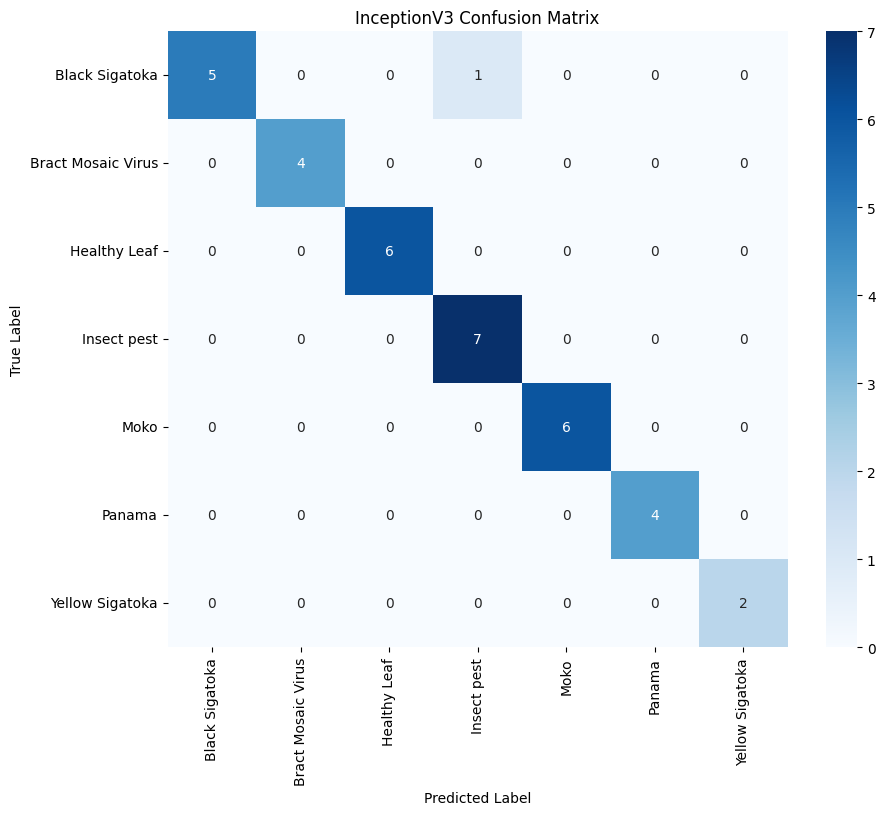

In [292]:
# Confusion Matrix
cm = confusion_matrix(y_true, y_pred)
class_names=["Black Sigatoka", "Bract Mosaic Virus", "Healthy Leaf", "Insect pest", "Moko", "Panama", "Yellow Sigatoka"]

plt.figure(figsize=(10, 8))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues",
            xticklabels=class_names,
            yticklabels=class_names)
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("InceptionV3 Confusion Matrix")
plt.show()


In [294]:
model_inception.save("bananaplant_inceptionv3.keras")

In [ ]:
#RESNET50 MODEL

In [157]:
from tensorflow.keras.preprocessing import image_dataset_from_directory
from tensorflow.keras.applications.resnet50 import preprocess_input
import tensorflow as tf

# Constants
IMAGE_SIZE = 224
BATCH_SIZE = 16
CHANNELS = 3
DATASET_PATH = r"C:\Users\narth\Downloads\Banana Disease Recognition Dataset\Banana Dataset Cleaned"  # update path

# Load dataset with validation split
train_ds_resnet = image_dataset_from_directory(
    DATASET_PATH,
    validation_split=0.2,
    subset="training",
    seed=123,
    image_size=(IMAGE_SIZE, IMAGE_SIZE),
    batch_size=BATCH_SIZE,
    label_mode='int'
)

val_ds_resnet = image_dataset_from_directory(
    DATASET_PATH,
    validation_split=0.2,
    subset="validation",
    seed=123,
    image_size=(IMAGE_SIZE, IMAGE_SIZE),
    batch_size=BATCH_SIZE,
    label_mode='int'
)

# Class names and count
class_names = train_ds_resnet.class_names
num_classes = len(class_names)

# Preprocessing (ResNet-specific)
def preprocess_resnet(image, label):
    return preprocess_input(image), label

train_ds_resnet = train_ds_resnet.map(preprocess_resnet).prefetch(buffer_size=tf.data.AUTOTUNE)
val_ds_resnet = val_ds_resnet.map(preprocess_resnet).prefetch(buffer_size=tf.data.AUTOTUNE)


Found 611 files belonging to 7 classes.
Using 489 files for training.
Found 611 files belonging to 7 classes.
Using 122 files for validation.


In [161]:
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.layers import InputLayer, GlobalAveragePooling2D, Dense
from tensorflow.keras.models import Sequential

# Load ResNet50 base model
resnet_base = ResNet50(input_shape=(IMAGE_SIZE, IMAGE_SIZE, CHANNELS),
                       include_top=False,
                       weights='imagenet')

resnet_base.trainable = False  # Freeze base model initially

# Define the full model
model_resnet = Sequential([
    InputLayer(input_shape=(IMAGE_SIZE, IMAGE_SIZE, CHANNELS)),
    resnet_base,
    GlobalAveragePooling2D(),
    Dense(num_classes, activation='softmax')
])

# Compile model
model_resnet.compile(
    optimizer='adam',
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)

# Model summary
model_resnet.summary()


Model: "sequential_14"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 resnet50 (Functional)       (None, 7, 7, 2048)        23587712  
                                                                 
 global_average_pooling2d_1  (None, 2048)              0         
 0 (GlobalAveragePooling2D)                                      
                                                                 
 dense_14 (Dense)            (None, 7)                 14343     
                                                                 
Total params: 23602055 (90.03 MB)
Trainable params: 14343 (56.03 KB)
Non-trainable params: 23587712 (89.98 MB)
_________________________________________________________________


In [163]:
EPOCHS = 10  # Or any number suitable for your training

history_resnet = model_resnet.fit(
    train_ds_resnet,
    validation_data=val_ds_resnet,
    epochs=EPOCHS
)


Epoch 1/10
31/31 [==============================] - 24s 648ms/step - loss: 1.1315 - accuracy: 0.5951 - val_loss: 0.4955 - val_accuracy: 0.8607
Epoch 2/10
31/31 [==============================] - 19s 616ms/step - loss: 0.2698 - accuracy: 0.9243 - val_loss: 0.3465 - val_accuracy: 0.9180
Epoch 3/10
31/31 [==============================] - 19s 596ms/step - loss: 0.1271 - accuracy: 0.9836 - val_loss: 0.3068 - val_accuracy: 0.9098
Epoch 4/10
31/31 [==============================] - 21s 667ms/step - loss: 0.0866 - accuracy: 0.9959 - val_loss: 0.2796 - val_accuracy: 0.9180
Epoch 5/10
31/31 [==============================] - 18s 594ms/step - loss: 0.0593 - accuracy: 1.0000 - val_loss: 0.2581 - val_accuracy: 0.9098
Epoch 6/10
31/31 [==============================] - 18s 578ms/step - loss: 0.0430 - accuracy: 1.0000 - val_loss: 0.2419 - val_accuracy: 0.9262
Epoch 7/10
31/31 [==============================] - 19s 606ms/step - loss: 0.0339 - accuracy: 1.0000 - val_loss: 0.2349 - val_accuracy: 0.9262

In [165]:
# Unfreeze top layers for fine-tuning
resnet_base.trainable = True

# Freeze all layers except the last 30
for layer in resnet_base.layers[:-30]:
    layer.trainable = False

# Recompile with lower learning rate
model_resnet.compile(
    optimizer=tf.keras.optimizers.Adam(1e-5),
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)

# Fine-tune the model
fine_tune_epochs = 10
total_epochs = EPOCHS + fine_tune_epochs

history_finetune_resnet = model_resnet.fit(
    train_ds_resnet,
    validation_data=val_ds_resnet,
    epochs=total_epochs,
    initial_epoch=history_resnet.epoch[-1]
)


Epoch 10/20
31/31 [==============================] - 31s 791ms/step - loss: 0.4824 - accuracy: 0.8425 - val_loss: 0.2339 - val_accuracy: 0.9098
Epoch 11/20
31/31 [==============================] - 24s 769ms/step - loss: 0.1999 - accuracy: 0.9550 - val_loss: 0.2297 - val_accuracy: 0.9098
Epoch 12/20
31/31 [==============================] - 24s 782ms/step - loss: 0.1297 - accuracy: 0.9836 - val_loss: 0.2270 - val_accuracy: 0.9098
Epoch 13/20
31/31 [==============================] - 27s 862ms/step - loss: 0.0729 - accuracy: 0.9959 - val_loss: 0.2252 - val_accuracy: 0.9098
Epoch 14/20
31/31 [==============================] - 24s 775ms/step - loss: 0.0546 - accuracy: 1.0000 - val_loss: 0.2260 - val_accuracy: 0.9098
Epoch 15/20
31/31 [==============================] - 24s 772ms/step - loss: 0.0437 - accuracy: 0.9980 - val_loss: 0.2262 - val_accuracy: 0.9180
Epoch 16/20
31/31 [==============================] - 24s 763ms/step - loss: 0.0407 - accuracy: 1.0000 - val_loss: 0.2254 - val_accuracy:

4/4 [==============================] - 3s 715ms/step
Accuracy: 0.9262
Classification Report:
                                   precision    recall  f1-score   support

    Banana Black Sigatoka Disease       0.88      0.79      0.83        19
Banana Bract Mosaic Virus Disease       1.00      0.92      0.96        13
              Banana Healthy Leaf       0.96      1.00      0.98        23
       Banana Insect Pest Disease       0.97      0.94      0.96        36
              Banana Moko Disease       0.88      1.00      0.94        15
            Banana Panama Disease       0.89      0.89      0.89         9
   Banana Yellow Sigatoka Disease       0.75      0.86      0.80         7

                         accuracy                           0.93       122
                        macro avg       0.90      0.91      0.91       122
                     weighted avg       0.93      0.93      0.93       122



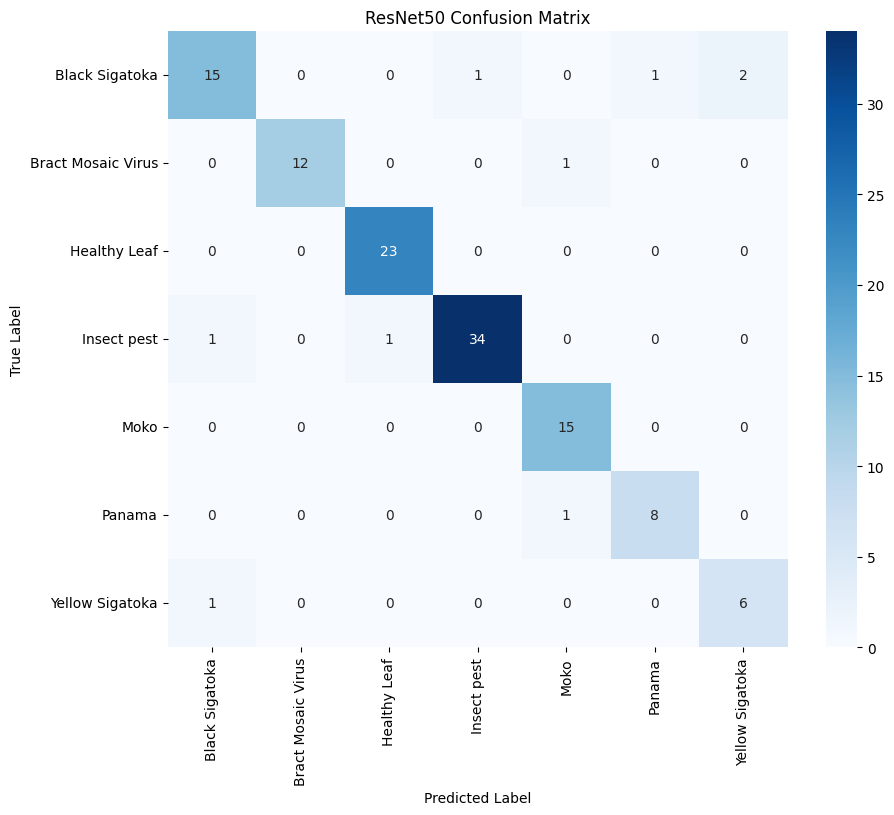

In [181]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score

# Prepare test data
test_images_resnet = []
test_labels_resnet = []

for images, labels in val_ds_resnet:
    test_images_resnet.append(images.numpy())
    test_labels_resnet.append(labels.numpy())

test_images_resnet = np.concatenate(test_images_resnet, axis=0)
test_labels_resnet = np.concatenate(test_labels_resnet, axis=0)

# Predict
y_pred_probs_resnet = model_resnet.predict(test_images_resnet)
y_pred_resnet = np.argmax(y_pred_probs_resnet, axis=1)
y_true_resnet = test_labels_resnet

# Accuracy
acc_resnet = accuracy_score(y_true_resnet, y_pred_resnet)
print(f"Accuracy: {acc_resnet:.4f}")

# Classification Report
print("Classification Report:")
print(classification_report(y_true_resnet, y_pred_resnet, target_names=class_names))

# Confusion Matrix
cm_resnet = confusion_matrix(y_true_resnet, y_pred_resnet)
class_names=["Black Sigatoka", "Bract Mosaic Virus", "Healthy Leaf", "Insect pest", "Moko", "Panama", "Yellow Sigatoka"]
plt.figure(figsize=(10, 8))
sns.heatmap(cm_resnet, annot=True, fmt='d', cmap='Blues',
            xticklabels=class_names, yticklabels=class_names)
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('ResNet50 Confusion Matrix')
plt.show()


In [183]:
model_resnet.save("bananaplant_resnet1.keras")

In [ ]:
#EFFICIENTNETB0 MODEL

In [185]:
from tensorflow.keras.preprocessing import image_dataset_from_directory
from tensorflow.keras.applications.efficientnet import preprocess_input
import tensorflow as tf

# Constants
IMAGE_SIZE_EFF = 224  # EfficientNetB0 default
BATCH_SIZE = 32
CHANNELS = 3
DATASET_PATH_EFF = r"C:\Users\narth\Downloads\Banana Disease Recognition Dataset\Banana Dataset Cleaned"  # update path

# Load dataset with validation split
train_ds_eff = image_dataset_from_directory(
    DATASET_PATH_EFF,
    validation_split=0.2,
    subset="training",
    seed=123,
    image_size=(IMAGE_SIZE_EFF, IMAGE_SIZE_EFF),
    batch_size=BATCH_SIZE,
    label_mode='int'
)

val_ds_eff = image_dataset_from_directory(
    DATASET_PATH_EFF,
    validation_split=0.2,
    subset="validation",
    seed=123,
    image_size=(IMAGE_SIZE_EFF, IMAGE_SIZE_EFF),
    batch_size=BATCH_SIZE,
    label_mode='int'
)

# Class names and count
class_names_eff = train_ds_eff.class_names
num_classes_eff = len(class_names_eff)

# Preprocessing (EfficientNet-specific)
def preprocess_eff(image, label):
    return preprocess_input(image), label

# Apply preprocessing
train_ds_eff = train_ds_eff.map(preprocess_eff).prefetch(buffer_size=tf.data.AUTOTUNE)
val_ds_eff = val_ds_eff.map(preprocess_eff).prefetch(buffer_size=tf.data.AUTOTUNE)


Found 611 files belonging to 7 classes.
Using 489 files for training.
Found 611 files belonging to 7 classes.
Using 122 files for validation.


In [187]:
from tensorflow.keras.applications import EfficientNetB0
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense, InputLayer
from tensorflow.keras.models import Sequential
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Load pre-trained base model
eff_base = EfficientNetB0(include_top=False, input_shape=(IMAGE_SIZE_EFF, IMAGE_SIZE_EFF, CHANNELS), weights='imagenet')
eff_base.trainable = False  # freeze base initially

# Build model
model_eff = Sequential([
    InputLayer(input_shape=(IMAGE_SIZE_EFF, IMAGE_SIZE_EFF, CHANNELS)),
    eff_base,
    GlobalAveragePooling2D(),
    Dense(num_classes_eff, activation='softmax')
])

model_eff.compile(optimizer='adam',
                  loss='sparse_categorical_crossentropy',
                  metrics=['accuracy'])

# Model summary (optional)
model_eff.build((None, IMAGE_SIZE_EFF, IMAGE_SIZE_EFF, CHANNELS))
model_eff.summary()

# Train
EPOCHS = 10
history_eff = model_eff.fit(train_ds_eff,
                            validation_data=val_ds_eff,
                            epochs=EPOCHS)


Model: "sequential_16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 efficientnetb0 (Functional  (None, 7, 7, 1280)        4049571   
 )                                                               
                                                                 
 global_average_pooling2d_1  (None, 1280)              0         
 2 (GlobalAveragePooling2D)                                      
                                                                 
 dense_16 (Dense)            (None, 7)                 8967      
                                                                 
Total params: 4058538 (15.48 MB)
Trainable params: 8967 (35.03 KB)
Non-trainable params: 4049571 (15.45 MB)
_________________________________________________________________
Epoch 1/10
16/16 [==============================] - 13s 493ms/step - loss: 1.5812 - accuracy: 0.4110 - val_loss: 1.0796 - val_accuracy: 0.6721


In [189]:
# Unfreeze top layers of base model
eff_base.trainable = True

# Freeze all layers except last 30
for layer in eff_base.layers[:-30]:
    layer.trainable = False

# Compile again with lower learning rate
model_eff.compile(optimizer=tf.keras.optimizers.Adam(1e-5),
                  loss='sparse_categorical_crossentropy',
                  metrics=['accuracy'])

# Fine-tune
fine_tune_epochs = 10
total_epochs = EPOCHS + fine_tune_epochs

history_eff_ft = model_eff.fit(train_ds_eff,
                               validation_data=val_ds_eff,
                               epochs=total_epochs,
                               initial_epoch=history_eff.epoch[-1])


Epoch 10/20
16/16 [==============================] - 14s 522ms/step - loss: 0.7268 - accuracy: 0.7975 - val_loss: 0.2663 - val_accuracy: 0.9344
Epoch 11/20
16/16 [==============================] - 7s 462ms/step - loss: 0.6467 - accuracy: 0.8282 - val_loss: 0.2720 - val_accuracy: 0.9180
Epoch 12/20
16/16 [==============================] - 7s 464ms/step - loss: 0.5996 - accuracy: 0.8466 - val_loss: 0.2828 - val_accuracy: 0.9262
Epoch 13/20
16/16 [==============================] - 7s 447ms/step - loss: 0.5280 - accuracy: 0.8691 - val_loss: 0.2950 - val_accuracy: 0.9180
Epoch 14/20
16/16 [==============================] - 7s 434ms/step - loss: 0.5231 - accuracy: 0.8793 - val_loss: 0.3081 - val_accuracy: 0.8934
Epoch 15/20
16/16 [==============================] - 7s 434ms/step - loss: 0.4863 - accuracy: 0.8916 - val_loss: 0.3184 - val_accuracy: 0.9016
Epoch 16/20
16/16 [==============================] - 7s 426ms/step - loss: 0.4120 - accuracy: 0.9305 - val_loss: 0.3279 - val_accuracy: 0.901

1/1 [==============================] - 0s 267ms/step

✅ Accuracy: 0.9016

📋 Classification Report:
                                   precision    recall  f1-score   support

    Banana Black Sigatoka Disease       0.83      1.00      0.90        19
Banana Bract Mosaic Virus Disease       1.00      1.00      1.00        13
              Banana Healthy Leaf       0.85      1.00      0.92        23
       Banana Insect Pest Disease       1.00      0.83      0.91        36
              Banana Moko Disease       0.83      1.00      0.91        15
            Banana Panama Disease       0.86      0.67      0.75         9
   Banana Yellow Sigatoka Disease       1.00      0.57      0.73         7

                         accuracy                           0.90       122
                        macro avg       0.91      0.87      0.87       122
                     weighted avg       0.91      0.90      0.90       122



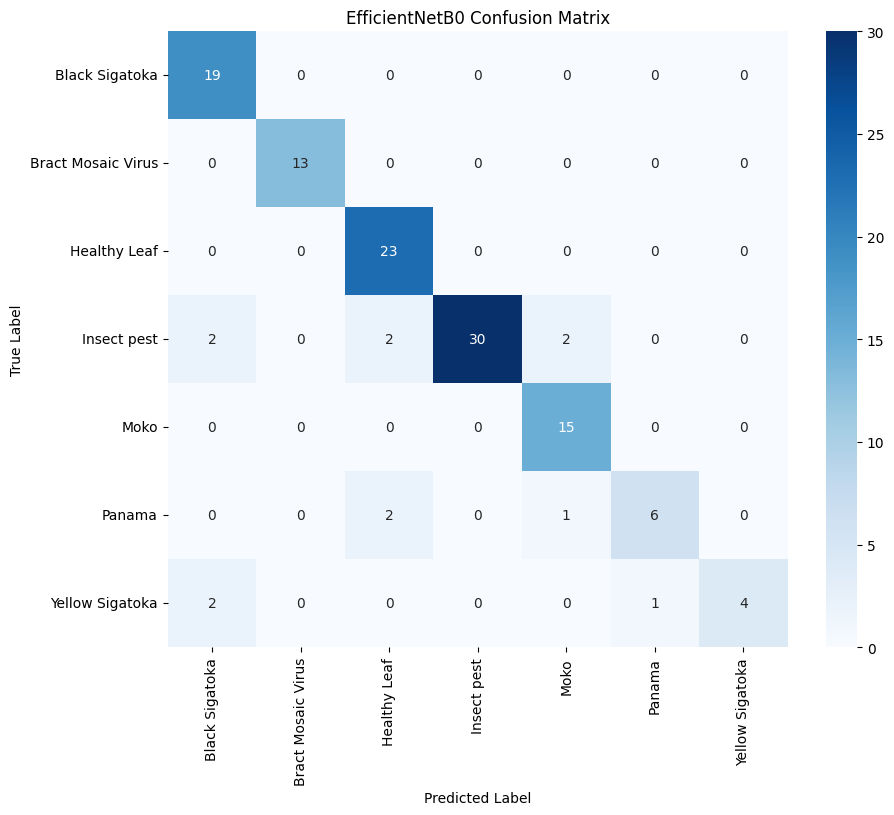

In [195]:
# Prepare data for evaluation
y_true = []
y_pred = []

for images, labels in val_ds_eff:
    preds = model_eff.predict(images)
    y_true.extend(labels.numpy())
    y_pred.extend(np.argmax(preds, axis=1))

# Accuracy
acc = accuracy_score(y_true, y_pred)
print(f"\n✅ Accuracy: {acc:.4f}")

# Classification report
print("\n📋 Classification Report:")
print(classification_report(y_true, y_pred, target_names=class_names_eff))

# Confusion matrix
cm = confusion_matrix(y_true, y_pred)
class_names_eff=["Black Sigatoka", "Bract Mosaic Virus", "Healthy Leaf", "Insect pest", "Moko", "Panama", "Yellow Sigatoka"]
# Plot confusion matrix
plt.figure(figsize=(10, 8))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=class_names_eff, yticklabels=class_names_eff)
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("EfficientNetB0 Confusion Matrix")
plt.show()


In [197]:
model_eff.save("bananaplant_eff.keras")

Found 611 files belonging to 7 classes.
Using 122 files for validation.

Evaluating Custom CNN...
Found 611 files belonging to 7 classes.
Using 122 files for validation.
1/1 [==============================] - 0s 356ms/step
Accuracy: 0.9426 | Loss: 0.3798 | Time: 1.19 sec
Classification Report:
                                   precision    recall  f1-score   support

    Banana Black Sigatoka Disease       0.94      0.84      0.89        19
Banana Bract Mosaic Virus Disease       0.85      0.85      0.85        13
              Banana Healthy Leaf       1.00      1.00      1.00        23
       Banana Insect Pest Disease       1.00      0.97      0.99        36
              Banana Moko Disease       1.00      0.93      0.97        15
            Banana Panama Disease       0.90      1.00      0.95         9
   Banana Yellow Sigatoka Disease       0.70      1.00      0.82         7

                         accuracy                           0.94       122
                        macr

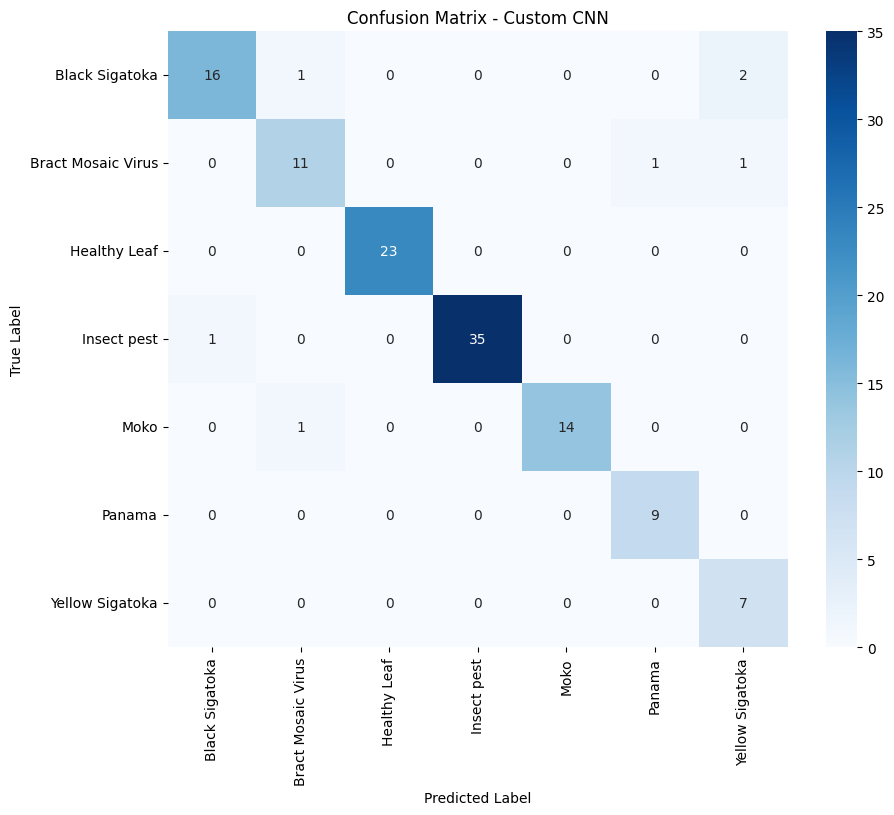


Evaluating InceptionV3...
Found 611 files belonging to 7 classes.
Using 122 files for validation.
1/1 [==============================] - 2s 2s/step
Accuracy: 0.1885 | Loss: 3.0885 | Time: 6.13 sec
Classification Report:
                    precision    recall  f1-score   support

    Black Sigatoka       0.00      0.00      0.00        19
Bract Mosaic Virus       0.00      0.00      0.00        13
      Healthy Leaf       0.19      1.00      0.32        23
       Insect pest       0.00      0.00      0.00        36
              Moko       0.00      0.00      0.00        15
            Panama       0.00      0.00      0.00         9
   Yellow Sigatoka       0.00      0.00      0.00         7

          accuracy                           0.19       122
         macro avg       0.03      0.14      0.05       122
      weighted avg       0.04      0.19      0.06       122



C:\Users\narth\.conda\envs\py311\Lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\narth\.conda\envs\py311\Lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\narth\.conda\envs\py311\Lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


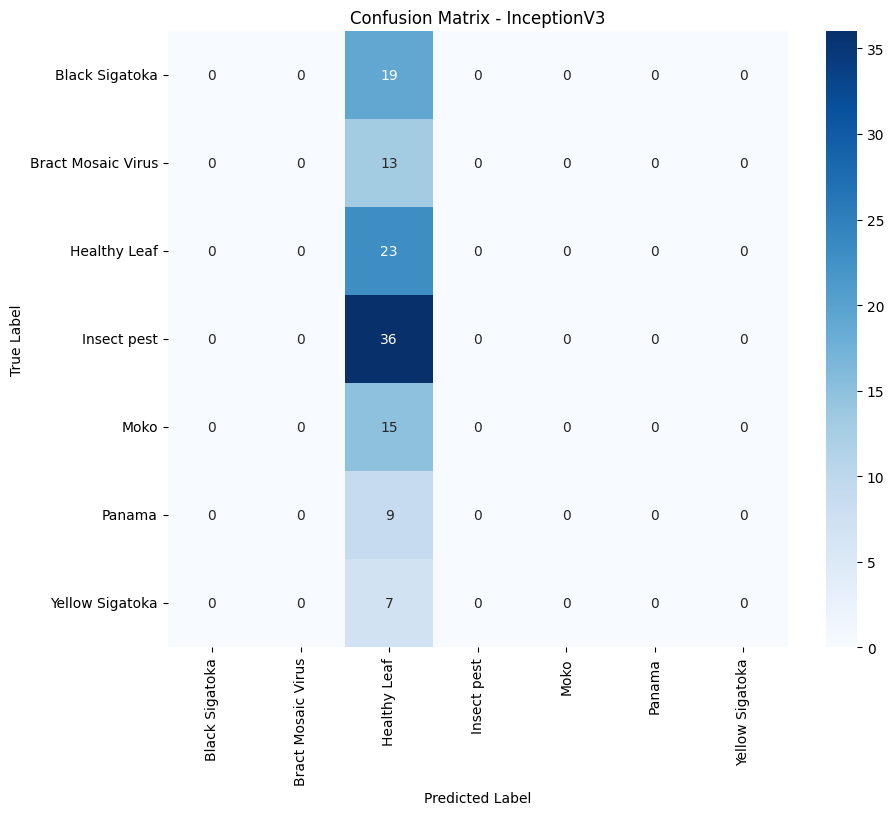


Evaluating ResNet50...
Found 611 files belonging to 7 classes.
Using 122 files for validation.
1/1 [==============================] - 2s 2s/step
Accuracy: 0.9262 | Loss: 0.2216 | Time: 6.10 sec
Classification Report:
                    precision    recall  f1-score   support

    Black Sigatoka       0.88      0.79      0.83        19
Bract Mosaic Virus       1.00      0.92      0.96        13
      Healthy Leaf       0.96      1.00      0.98        23
       Insect pest       0.97      0.94      0.96        36
              Moko       0.88      1.00      0.94        15
            Panama       0.89      0.89      0.89         9
   Yellow Sigatoka       0.75      0.86      0.80         7

          accuracy                           0.93       122
         macro avg       0.90      0.91      0.91       122
      weighted avg       0.93      0.93      0.93       122



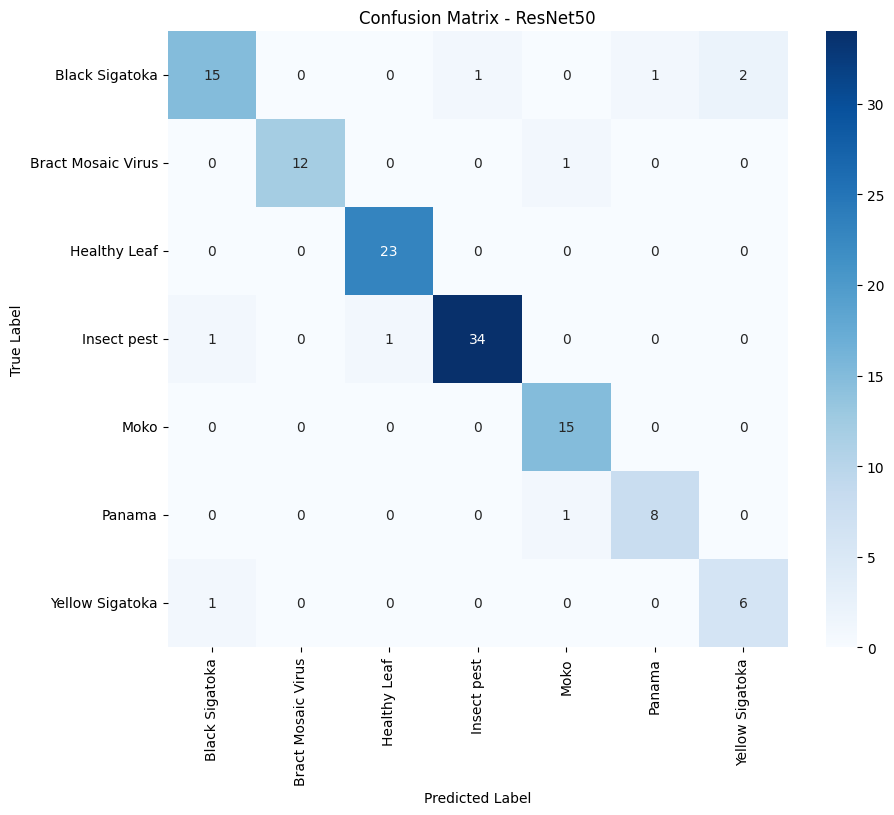


Evaluating EfficientNetB0...
Found 611 files belonging to 7 classes.
Using 122 files for validation.
1/1 [==============================] - 2s 2s/step
Accuracy: 0.9016 | Loss: 0.3491 | Time: 4.40 sec
Classification Report:
                    precision    recall  f1-score   support

    Black Sigatoka       0.83      1.00      0.90        19
Bract Mosaic Virus       1.00      1.00      1.00        13
      Healthy Leaf       0.85      1.00      0.92        23
       Insect pest       1.00      0.83      0.91        36
              Moko       0.83      1.00      0.91        15
            Panama       0.86      0.67      0.75         9
   Yellow Sigatoka       1.00      0.57      0.73         7

          accuracy                           0.90       122
         macro avg       0.91      0.87      0.87       122
      weighted avg       0.91      0.90      0.90       122



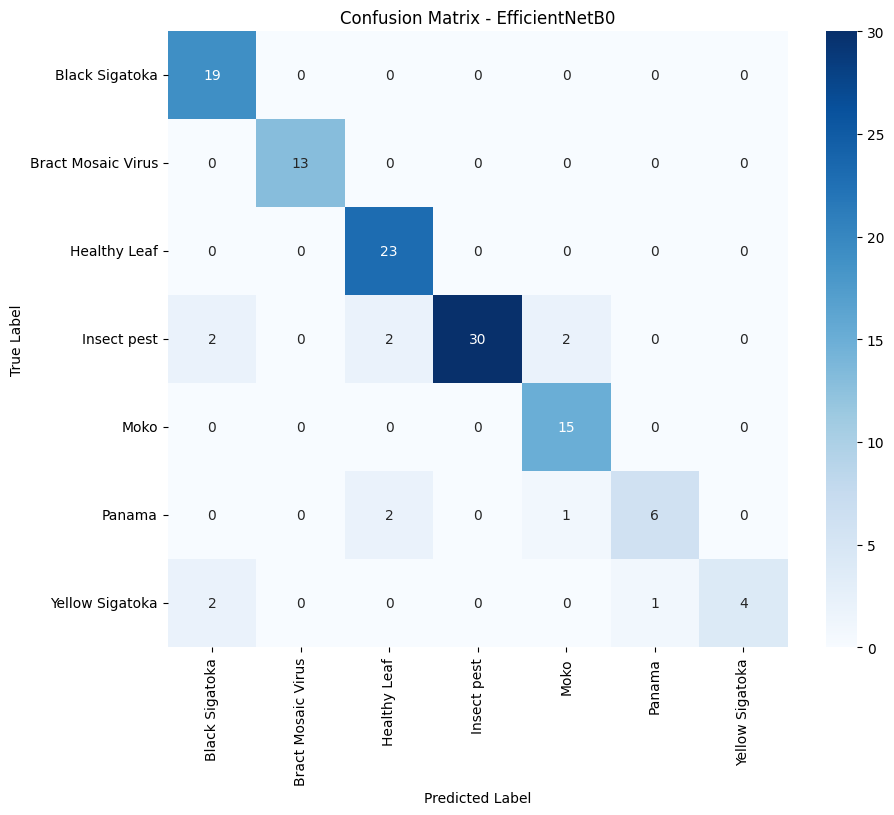

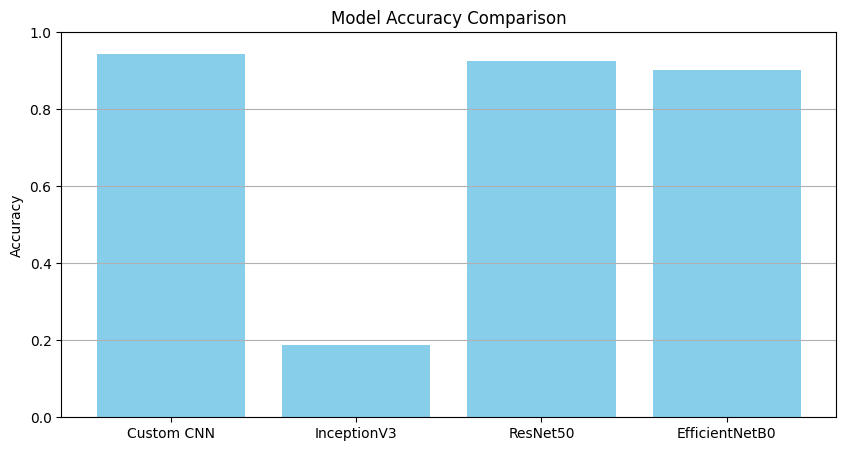

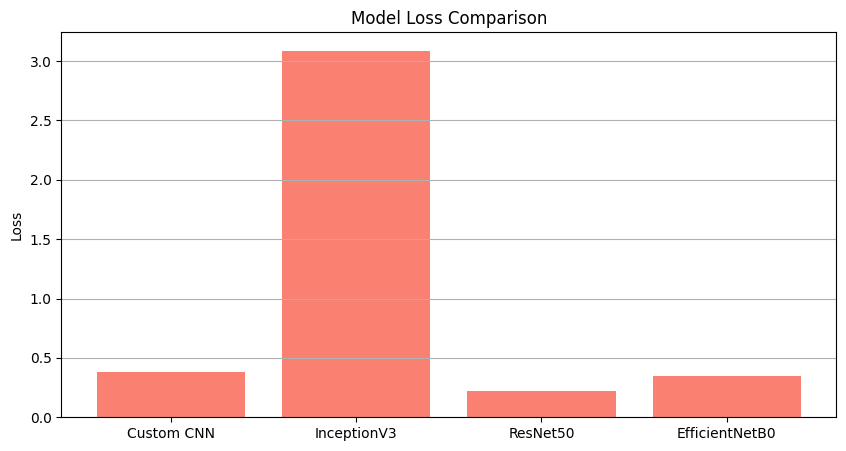

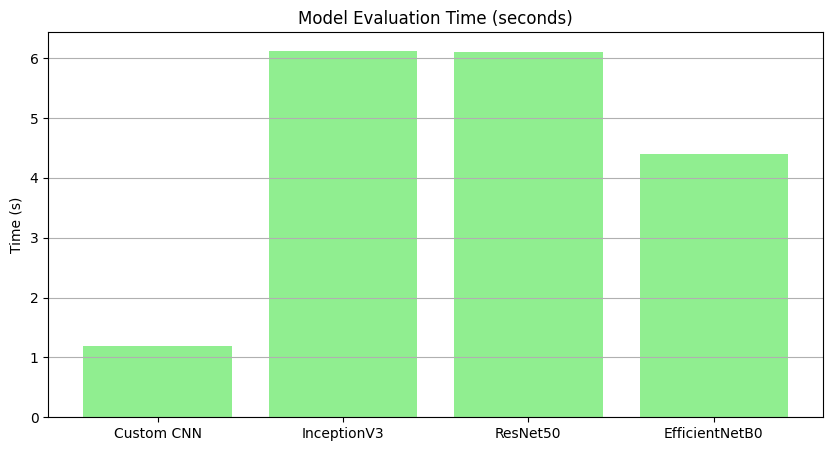


✅ Best Performing Model: **Custom CNN** with Accuracy: 94.26%


In [302]:
import tensorflow as tf
import numpy as np
import time
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing import image_dataset_from_directory
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix
import seaborn as sns

# Define paths to saved models
model_paths = {
    "Custom CNN": r"C:\Users\narth\Downloads\bananaplant_tf2152.keras",
    "InceptionV3": r"C:\Users\narth\Downloads\bananaplant_inceptionv3.keras",
    "ResNet50": r"C:\Users\narth\Downloads\bananaplant_resnet1.keras",
    "EfficientNetB0": r"C:\Users\narth\Downloads\bananaplant_eff.keras"
}

# Dataset path and constants
dataset_path = r"C:\Users\narth\Downloads\Banana Disease Recognition Dataset\Banana Dataset Cleaned"
batch_size = 32

# Fetch class names using a sample load
temp_ds = image_dataset_from_directory(
    dataset_path,
    validation_split=0.2,
    subset="validation",
    seed=123,
    batch_size=batch_size,
    image_size=(224, 224),
    label_mode='int'
)
class_names = temp_ds.class_names
num_classes = len(class_names)

# Preprocessing dispatcher

def preprocess_model_input(x, model_name):
    if model_name == "InceptionV3":
        from tensorflow.keras.applications.inception_v3 import preprocess_input
    elif model_name == "ResNet50":
        from tensorflow.keras.applications.resnet50 import preprocess_input
    elif model_name == "EfficientNetB0":
        from tensorflow.keras.applications.efficientnet import preprocess_input
    else:
        return x
    return preprocess_input(x)

# Store results for comparison
results = {}

# Evaluate all models
for name, path in model_paths.items():
    print(f"\nEvaluating {name}...")
    model = tf.keras.models.load_model(path)

    # Choose input size based on model architecture
    current_img_size = (299, 299) if name == "InceptionV3" else (224, 224)

    val_ds = image_dataset_from_directory(
        dataset_path,
        validation_split=0.2,
        subset="validation",
        seed=123,
        batch_size=batch_size,
        image_size=current_img_size,
        label_mode='int'
    )

    # Apply model-specific preprocessing
  # Apply correct preprocessing


    if name == "InceptionV3":
         from tensorflow.keras.applications.inception_v3 import preprocess_input
    elif name == "ResNet50":
         from tensorflow.keras.applications.resnet50 import preprocess_input
    elif name == "EfficientNetB0":
         from tensorflow.keras.applications.efficientnet import preprocess_input
    else:
         preprocess_input = lambda x: x  # For Custom CNN

    val_ds = val_ds.map(lambda x, y: (preprocess_input(x), y)).prefetch(tf.data.AUTOTUNE)
    # Evaluate
    start = time.time()
    loss, acc = model.evaluate(val_ds, verbose=0)
    duration = time.time() - start

    # Predictions and metrics
    y_true, y_pred = [], []
    for x_batch, y_batch in val_ds:
        preds = model.predict(x_batch)
        y_true.extend(y_batch.numpy())
        y_pred.extend(np.argmax(preds, axis=1))

    acc_score = accuracy_score(y_true, y_pred)
    print(f"Accuracy: {acc_score:.4f} | Loss: {loss:.4f} | Time: {duration:.2f} sec")
    print("Classification Report:")
    print(classification_report(y_true, y_pred, target_names=class_names))

    # Confusion matrix
    cm = confusion_matrix(y_true, y_pred)
    class_names=["Black Sigatoka", "Bract Mosaic Virus", "Healthy Leaf", "Insect pest", "Moko", "Panama", "Yellow Sigatoka"]
    plt.figure(figsize=(10, 8))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=class_names, yticklabels=class_names)
    plt.title(f"Confusion Matrix - {name}")
    plt.xlabel("Predicted Label")
    plt.ylabel("True Label")
    plt.show()

    results[name] = {
        "accuracy": acc_score,
        "loss": loss,
        "time": duration
    }

# Accuracy comparison plot
plt.figure(figsize=(10, 5))
plt.bar(results.keys(), [v["accuracy"] for v in results.values()], color='skyblue')
plt.title("Model Accuracy Comparison")
plt.ylabel("Accuracy")
plt.ylim(0, 1)
plt.grid(True, axis='y')
plt.show()

# Loss comparison plot
plt.figure(figsize=(10, 5))
plt.bar(results.keys(), [v["loss"] for v in results.values()], color='salmon')
plt.title("Model Loss Comparison")
plt.ylabel("Loss")
plt.grid(True, axis='y')
plt.show()

# Time comparison plot
plt.figure(figsize=(10, 5))
plt.bar(results.keys(), [v["time"] for v in results.values()], color='lightgreen')
plt.title("Model Evaluation Time (seconds)")
plt.ylabel("Time (s)")
plt.grid(True, axis='y')
plt.show()

# Best model summary
best_model = max(results.items(), key=lambda x: x[1]["accuracy"])
print(f"\n✅ Best Performing Model: **{best_model[0]}** with Accuracy: {best_model[1]['accuracy']*100:.2f}%")

Found 611 files belonging to 14 classes.

Evaluating Basic CNN...
Found 611 files belonging to 14 classes.
1/1 [==============================] - 0s 96ms/step
Accuracy: 0.7954 | Loss: 5.1475 | Time: 1.95 sec
                                             precision    recall  f1-score   support

    Augmented Banana Black Sigatoka Disease       0.84      0.79      0.82        87
Augmented Banana Bract Mosaic Virus Disease       0.68      0.87      0.76        68
              Augmented Banana Healthy Leaf       0.86      1.00      0.93       113
       Augmented Banana Insect Pest Disease       0.84      0.97      0.90       117
              Augmented Banana Moko Disease       0.85      0.79      0.82        71
            Augmented Banana Panama Disease       0.66      0.91      0.76        53
   Augmented Banana Yellow Sigatoka Disease       0.75      0.90      0.82        30
              Banana Black Sigatoka Disease       0.00      0.00      0.00        12
          Banana Bract Mos

C:\Users\narth\.conda\envs\py311\Lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\narth\.conda\envs\py311\Lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\narth\.conda\envs\py311\Lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Found 611 files belonging to 14 classes.
1/1 [==============================] - 1s 1s/step
Accuracy: 0.9918 | Loss: 0.0494 | Time: 15.56 sec
                                             precision    recall  f1-score   support

    Augmented Banana Black Sigatoka Disease       0.99      1.00      0.99        87
Augmented Banana Bract Mosaic Virus Disease       0.99      1.00      0.99        68
              Augmented Banana Healthy Leaf       0.99      1.00      1.00       113
       Augmented Banana Insect Pest Disease       1.00      1.00      1.00       117
              Augmented Banana Moko Disease       1.00      0.99      0.99        71
            Augmented Banana Panama Disease       0.98      0.98      0.98        53
   Augmented Banana Yellow Sigatoka Disease       1.00      1.00      1.00        30
              Banana Black Sigatoka Disease       1.00      0.92      0.96        12
          Banana Bract Mosaic Virus Disease       1.00      0.88      0.93         8
        

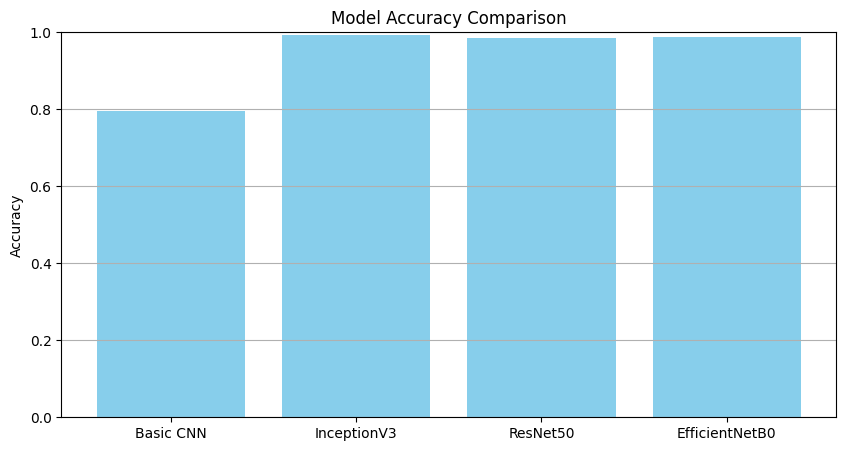

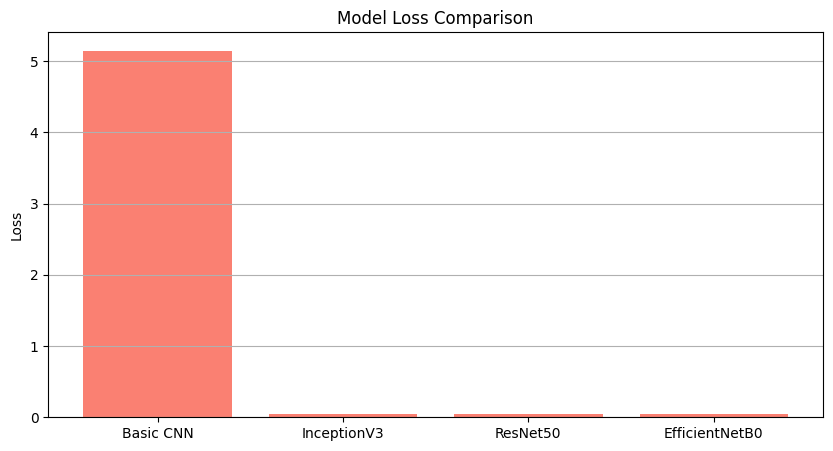

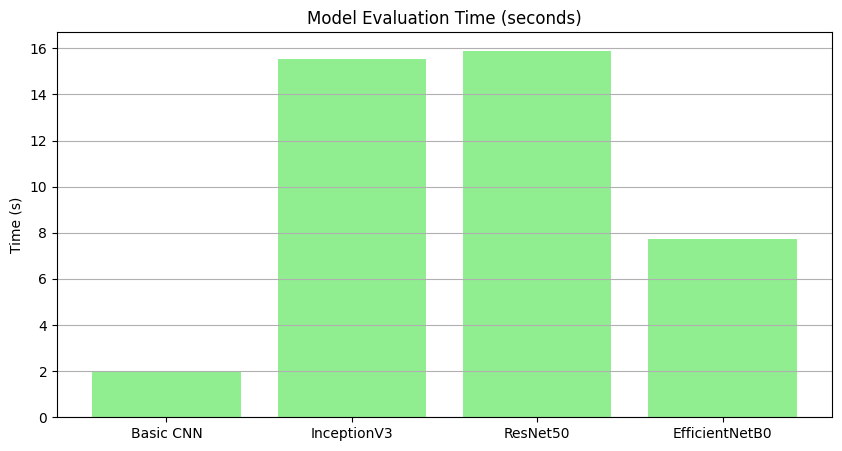


✅ Best Performing Model: **InceptionV3** with Accuracy: 99.18%


In [138]:
import tensorflow as tf
import numpy as np
import time
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing import image_dataset_from_directory
from sklearn.metrics import classification_report, accuracy_score


model_paths = {
    "Basic CNN": r"C:\Users\narth\Downloads\Banana Disease Recognition Dataset\training\bananaplant_tf215.keras",
    "InceptionV3": r"C:\Users\narth\Downloads\Banana Disease Recognition Dataset\training\bananaplant_inception.keras",
    "ResNet50": r"C:\Users\narth\Downloads\Banana Disease Recognition Dataset\training\bananaplant_resnet.keras",
    "EfficientNetB0": r"C:\Users\narth\Downloads\Banana Disease Recognition Dataset\training\bananaplant_eff.keras"
}

# Class names
dataset_path = "C:/Users/narth/Downloads/Banana Disease Recognition Dataset"
batch_size = 32

# Get class names from any one dataset load
temp_ds = image_dataset_from_directory(
    dataset_path + "/val",
    shuffle=False,
    batch_size=batch_size,
    image_size=(224, 224),  # temporary
    label_mode='int'
)
class_names = temp_ds.class_names
num_classes = len(class_names)

# Preprocess for different models
def preprocess_model_input(x, model_name):
    if model_name == "InceptionV3":
        from tensorflow.keras.applications.inception_v3 import preprocess_input
    elif model_name == "ResNet50":
        from tensorflow.keras.applications.resnet50 import preprocess_input
    elif model_name == "EfficientNetB0":
        from tensorflow.keras.applications.efficientnet import preprocess_input
    else:
        return x
    return preprocess_input(x)

# Store results
results = {}

# Evaluate each model
for name, path in model_paths.items():
    print(f"\nEvaluating {name}...")
    model = tf.keras.models.load_model(path)

    # Adjust image size based on model
    if name == "InceptionV3":
        current_img_size = (299, 299)
    else:
        current_img_size = (224, 224)

    val_ds_resized = image_dataset_from_directory(
        dataset_path + "/val",
        shuffle=False,
        batch_size=batch_size,
        image_size=current_img_size,
        label_mode='int'
    )

    val_ds_processed = val_ds_resized.map(lambda x, y: (preprocess_model_input(x, name), y)).prefetch(tf.data.AUTOTUNE)

    # Evaluate
    start = time.time()
    loss, acc = model.evaluate(val_ds_processed, verbose=0)
    duration = time.time() - start

    # Predict for detailed metrics
    y_true, y_pred = [], []
    for x_batch, y_batch in val_ds_processed:
        preds = model.predict(x_batch)
        y_true.extend(y_batch.numpy())
        y_pred.extend(np.argmax(preds, axis=1))

    acc_score = accuracy_score(y_true, y_pred)
    print(f"Accuracy: {acc_score:.4f} | Loss: {loss:.4f} | Time: {duration:.2f} sec")
    print(classification_report(y_true, y_pred, target_names=class_names))

    results[name] = {
        "accuracy": acc_score,
        "loss": loss,
        "time": duration
    }

# --- Plot Accuracy Comparison ---
plt.figure(figsize=(10, 5))
plt.bar(results.keys(), [v["accuracy"] for v in results.values()], color='skyblue')
plt.title("Model Accuracy Comparison")
plt.ylabel("Accuracy")
plt.ylim(0, 1)
plt.grid(True, axis='y')
plt.show()

# --- Plot Loss Comparison ---
plt.figure(figsize=(10, 5))
plt.bar(results.keys(), [v["loss"] for v in results.values()], color='salmon')
plt.title("Model Loss Comparison")
plt.ylabel("Loss")
plt.grid(True, axis='y')
plt.show()

# --- Plot Time Comparison ---
plt.figure(figsize=(10, 5))
plt.bar(results.keys(), [v["time"] for v in results.values()], color='lightgreen')
plt.title("Model Evaluation Time (seconds)")
plt.ylabel("Time (s)")
plt.grid(True, axis='y')
plt.show()

# --- Best Model Summary ---
best_model = max(results.items(), key=lambda x: x[1]["accuracy"])
print(f"\n✅ Best Performing Model: **{best_model[0]}** with Accuracy: {best_model[1]['accuracy']*100:.2f}%")


In [ ]:
#testing

In [206]:
def predict(model, img, model_name):
    # Resize image to the model's input size
    if model_name == "InceptionV3":
        from tensorflow.keras.applications.inception_v3 import preprocess_input
        img_resized = tf.image.resize(img, (299, 299))
    elif model_name == "ResNet50":
        from tensorflow.keras.applications.resnet50 import preprocess_input
        img_resized = tf.image.resize(img, (224, 224))
    elif model_name == "EfficientNetB0":
        from tensorflow.keras.applications.efficientnet import preprocess_input
        img_resized = tf.image.resize(img, (224, 224))
    else:
        img_resized = tf.image.resize(img, (224, 224))  # default for CNN

    img_array = tf.expand_dims(img_resized, axis=0)
    img_array = preprocess_input(img_array)

    predictions = model.predict(img_array, verbose=0)
    predicted_index = np.argmax(predictions)
    confidence = round(100 * np.max(predictions), 2)

    return class_names[predicted_index], confidence


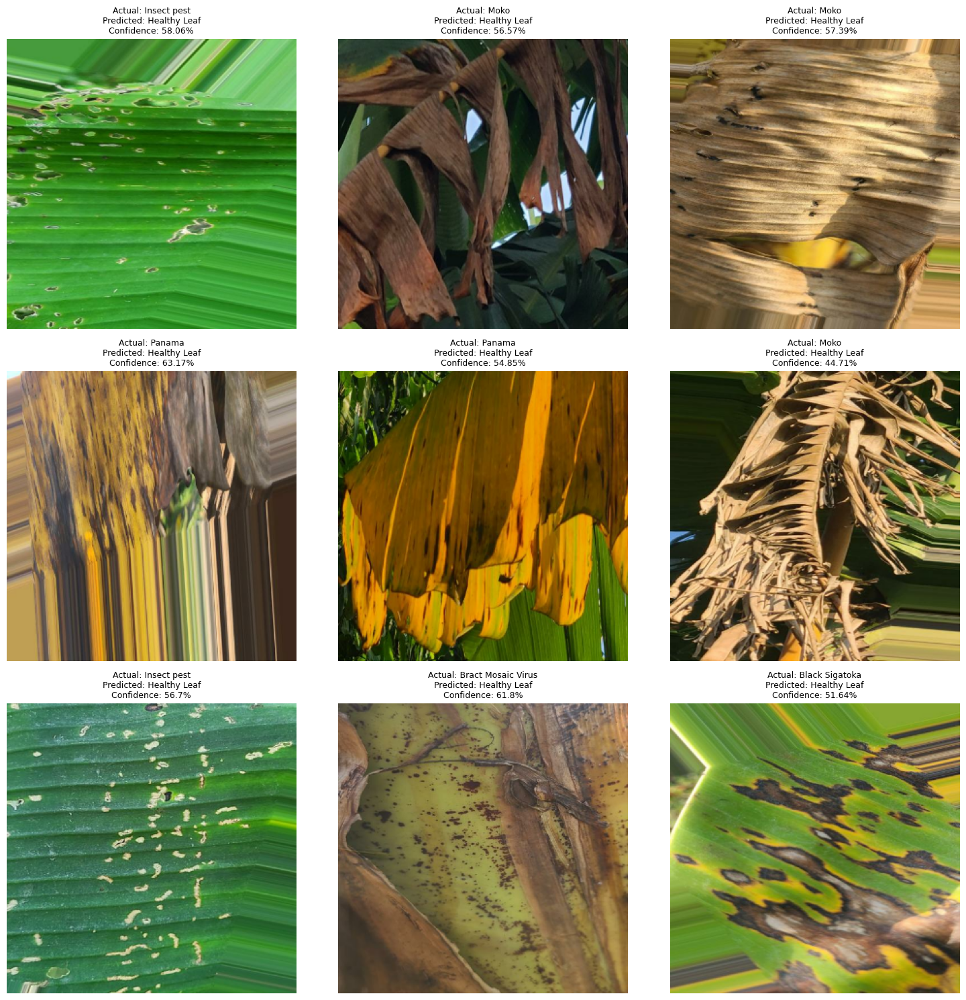

In [278]:
plt.figure(figsize=(15, 15))
for images, labels in test_ds.take(1):  # or use val_ds if that's your test set
    for i in range(9):
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))

        predicted_class, confidence = predict(model_inception, images[i].numpy(), "InceptionV3")
        actual_class = class_names[labels[i]]

        plt.title(f"Actual: {actual_class}\nPredicted: {predicted_class}\nConfidence: {confidence}%", fontsize=9)
        plt.axis("off")

plt.tight_layout()
plt.show()


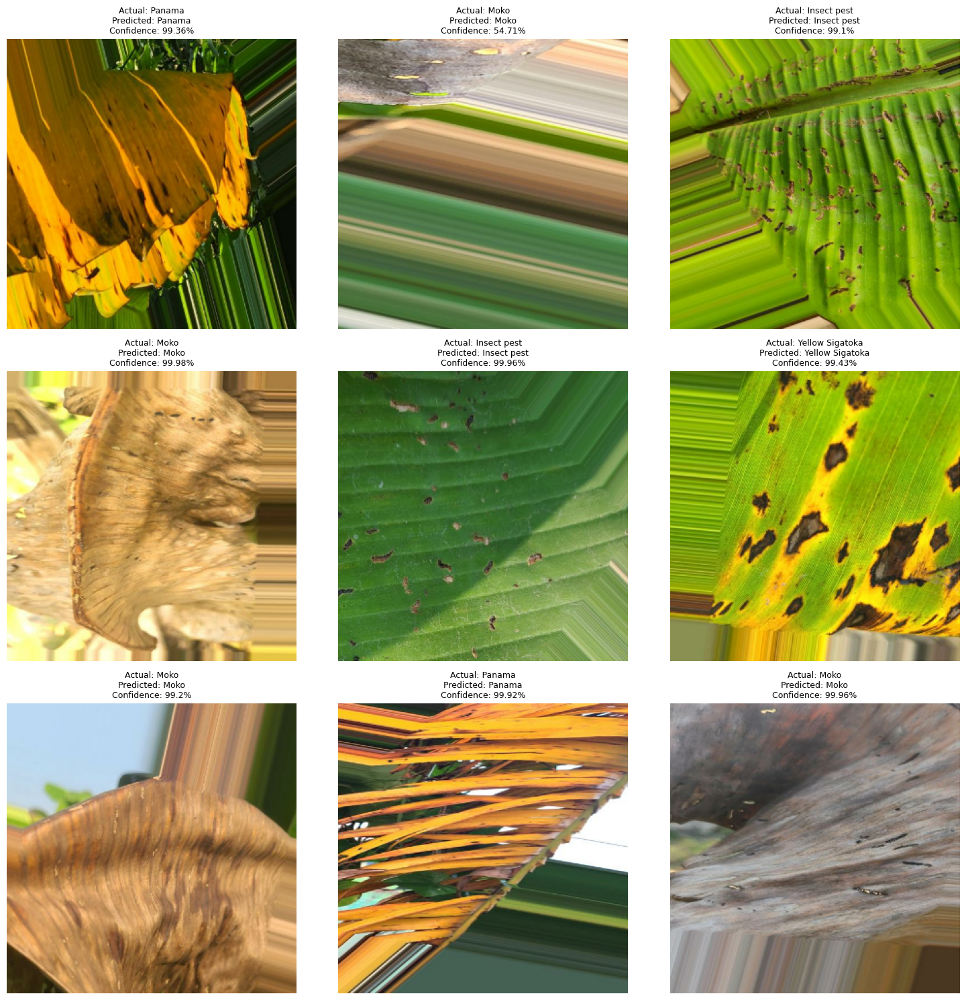

In [210]:
plt.figure(figsize=(15, 15))
for images, labels in test_ds.take(1):  # or use val_ds if that's your test set
    for i in range(9):
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))

        predicted_class, confidence = predict(model_resnet, images[i].numpy(), "ResNet50")
        actual_class = class_names[labels[i]]

        plt.title(f"Actual: {actual_class}\nPredicted: {predicted_class}\nConfidence: {confidence}%", fontsize=9)
        plt.axis("off")

plt.tight_layout()
plt.show()

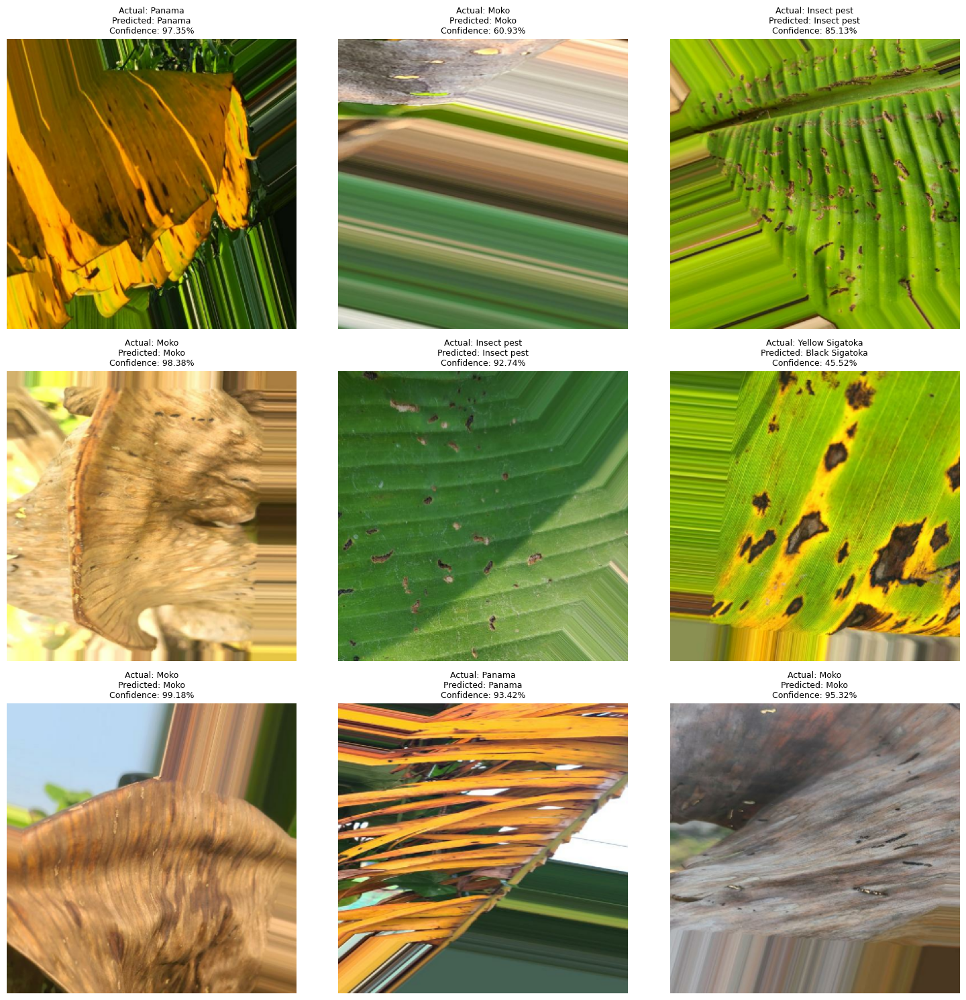

In [212]:
plt.figure(figsize=(15, 15))
for images, labels in test_ds.take(1):  # or use val_ds if that's your test set
    for i in range(9):
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))

        predicted_class, confidence = predict(model_eff, images[i].numpy(), "EfficientNetB0")
        actual_class = class_names[labels[i]]

        plt.title(f"Actual: {actual_class}\nPredicted: {predicted_class}\nConfidence: {confidence}%", fontsize=9)
        plt.axis("off")

plt.tight_layout()
plt.show()

In [216]:
import os
from collections import Counter

folder_path = r"C:\Users\narth\Downloads\Banana Disease Recognition Dataset\Banana Dataset Cleaned"

label_counts = {label: len(os.listdir(os.path.join(folder_path, label))) 
                for label in os.listdir(folder_path)}
print(label_counts)


{'Banana Black Sigatoka Disease': 99, 'Banana Bract Mosaic Virus Disease': 76, 'Banana Healthy Leaf': 128, 'Banana Insect Pest Disease': 132, 'Banana Moko Disease': 81, 'Banana Panama Disease': 61, 'Banana Yellow Sigatoka Disease': 34}


1/1 [==============================] - 0s 88ms/step


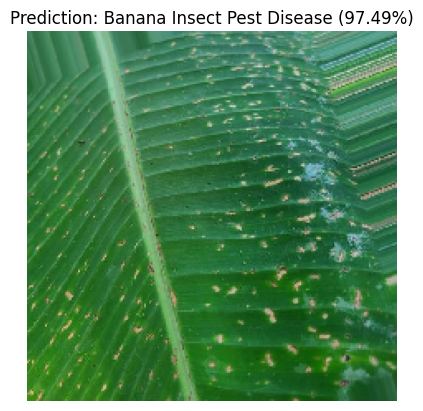

Predicted Class: Banana Insect Pest Disease
Confidence: 97.49%


In [144]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing import image
from tensorflow.keras.applications.efficientnet import preprocess_input  # or resnet50 or inception_v3
import os

# Load your saved model 
model = tf.keras.models.load_model(r"C:\Users\narth\Downloads\Banana Disease Recognition Dataset\training\bananaplant_tf215.keras")  # or use the in-memory 'model' if still running

# Class names 
class_names = ['Banana Black Sigatoka Disease',
 'Banana Bract Mosaic Virus Disease',
 'Banana Healthy Leaf',
 'Banana Insect Pest Disease',
 'Banana Moko Disease',
 'Banana Panama Disease',
 'Banana Yellow Sigatoka Disease'] 

# Function to predict a single image
def predict_image(img_path):
    img = image.load_img(img_path, target_size=(224, 224))  # or (299, 299) for InceptionV3
    img_array = image.img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)
    img_array = preprocess_input(img_array)

    predictions = model.predict(img_array)
    predicted_class = class_names[np.argmax(predictions)]
    confidence = np.max(predictions)

    # Plot image with predicted label
    plt.imshow(img)
    plt.axis('off')
    plt.title(f"Prediction: {predicted_class} ({confidence*100:.2f}%)")
    plt.show()

    print(f"Predicted Class: {predicted_class}")
    print(f"Confidence: {confidence*100:.2f}%")


predict_image(r"C:\Users\narth\Downloads\Banana Disease Recognition Dataset\Banana Dataset Cleaned\Banana Insect Pest Disease\Augmented Banana Insect Pest Disease (62).jpg")

In [ ]:
#inceptionv3 prediction

In [160]:
from tensorflow.keras.preprocessing import image
from tensorflow.keras.applications.inception_v3 import preprocess_input
import numpy as np
import tensorflow as tf

# Load model
model = tf.keras.models.load_model(r"C:\Users\narth\Downloads\Banana Disease Recognition Dataset\training\bananaplant_inception.keras")

# Load and preprocess image
img_path = r"C:\Users\narth\Downloads\Banana Disease Recognition Dataset\Banana Dataset Cleaned\Banana Yellow Sigatoka Disease\Augmented Banana Yellow Sigatoka Disease (32).jpg"
img = image.load_img(img_path, target_size=(299, 299))
img_array = image.img_to_array(img)
img_array = np.expand_dims(img_array, axis=0)  # (1, 299, 299, 3)
img_array = preprocess_input(img_array)

# Predict
preds = model.predict(img_array)
pred_class = np.argmax(preds)
class_names = ['Banana Black Sigatoka Disease',
 'Banana Bract Mosaic Virus Disease',
 'Banana Healthy Leaf',
 'Banana Insect Pest Disease',
 'Banana Moko Disease',
 'Banana Panama Disease',
 'Banana Yellow Sigatoka Disease']  
print("Predicted class:", class_names[pred_class])


1/1 [==============================] - 1s 978ms/step
Predicted class: Banana Yellow Sigatoka Disease
